In [1]:
# Data Source: Satellite Image from WIFIRE Project
# WIFIRE Project website: https://wifire.ucsd.edu/

In [2]:
#Libraries needed: numpy, scipy, matplotlib

In [3]:
%matplotlib inline
import numpy as np
from scipy import misc
import matplotlib.pyplot as plt

In [4]:
# Creating a numpy array from an image file

In [5]:
from skimage import data

# Let us load a satellite image from WIFIRE Project Dataset: https://wifire.ucsd.edu/

photo_data = misc.imread('./wifire/sd-3layers.jpg')
type(photo_data)

numpy.ndarray

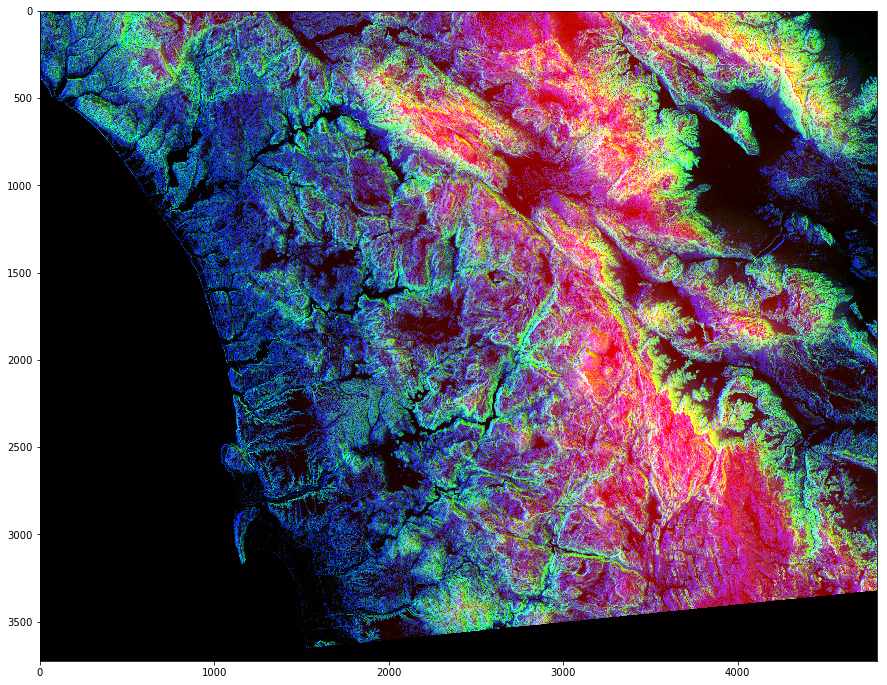

In [6]:
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

# RED Pixel intensity denotes altitude (higher value => more height)
# BLUE Pixel intensity denotes 
# GREEN Pixel intensity denotes 

In [7]:
photo_data.shape

(3725, 4797, 3)

In [8]:
photo_data.size

53606475

In [9]:
photo_data.min(), photo_data.max()

(0, 255)

In [10]:
photo_data.mean()

75.829935450894695

In [11]:
# Pixel on the 150th row and 250th column
photo_data[150, 250]

array([ 17,  35, 255], dtype=uint8)

In [12]:
# Set to zero (however, setting one pixel to zero is not noticeable)
photo_data[150, 250] = 0

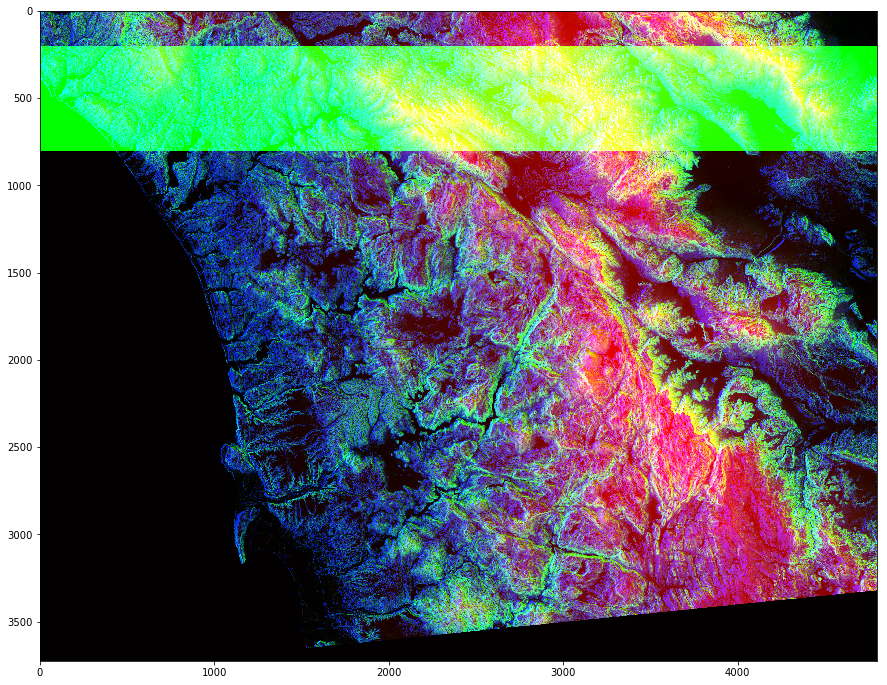

In [13]:
# So, let's try something bigger !
# Set to 255 : all pixels in a range
photo_data = misc.imread('./wifire/sd-3layers.jpg')

photo_data[200:800, : ,1] = 255
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

In [14]:
# Pick all pixels with low values (<50)

photo_data = misc.imread('./wifire/sd-3layers.jpg')
sieve = photo_data < 50
sieve.shape

(3725, 4797, 3)

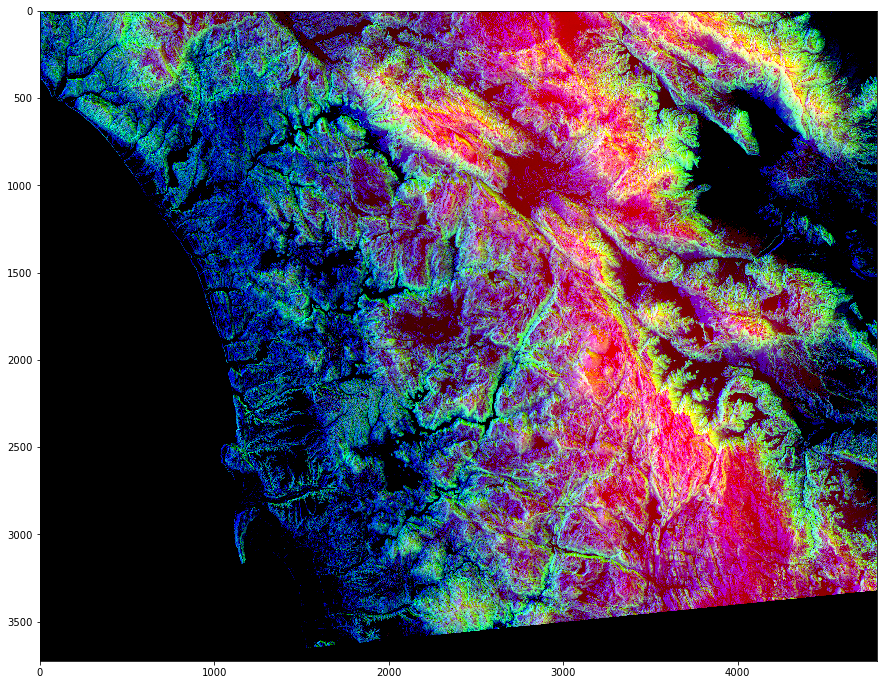

In [15]:
# Whenever the sieve is True: set value to 0 

import random
photo_data[sieve] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

In [16]:
# You can design complex patters by making cols a function of rows or vice-versa
# Here we try a linear relationship between rows and cols

rows = np.arange(len(photo_data))
cols = rows

In [17]:
photo_data[rows, cols] = 0

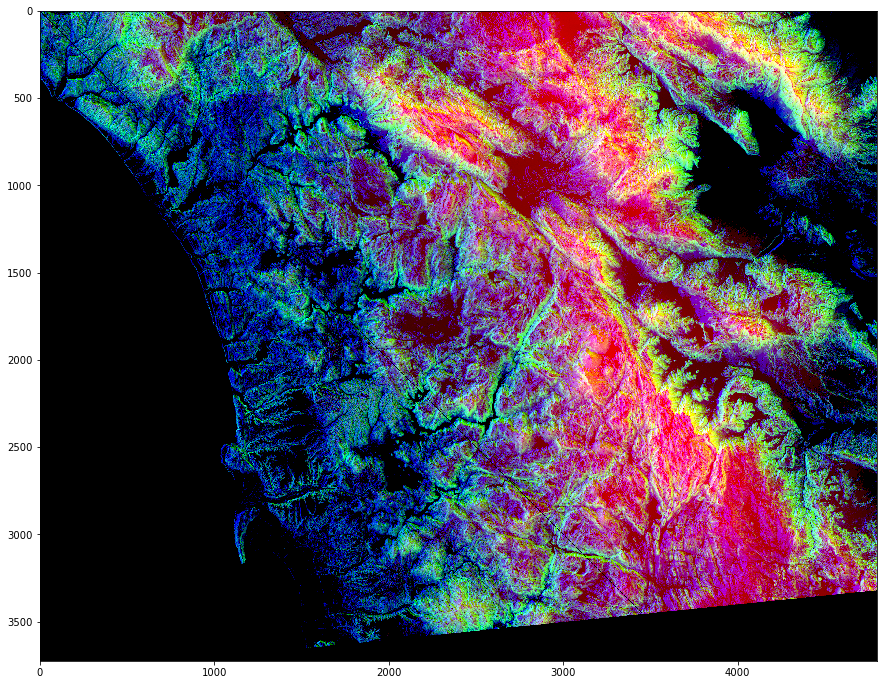

In [18]:
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

In [19]:
#Let us try something cool...a mask that is in shape of a circular disc

total_rows, total_cols, total_layers = photo_data.shape

X, Y = np.ogrid[:total_rows, :total_cols]

In [20]:
center_row, center_col = total_rows / 2, total_cols / 2

dist_from_center = (X - center_row)**2 + (Y - center_col)**2
radius = (total_rows / 2)**2
circular_sieve = (dist_from_center > radius)

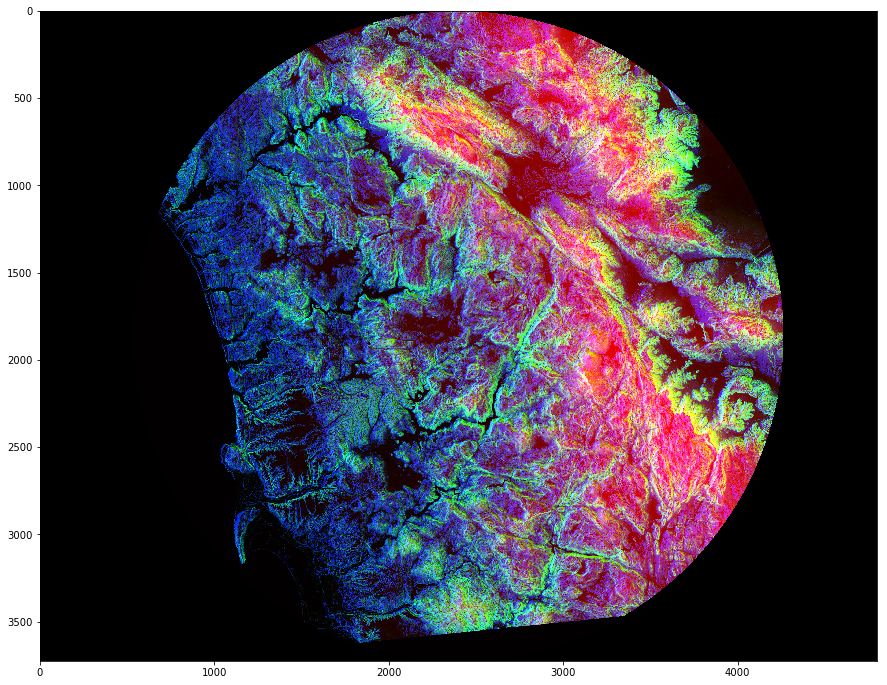

In [21]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')
photo_data[circular_sieve] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

In [22]:
# You can further improve the mask, for example just get upper half disc

X, Y = np.ogrid[:total_rows, :total_cols]
half_upper = X < center_row # this line generates a mask for all rows above the center

half_upper_sieve = np.logical_and(half_upper, circular_sieve)

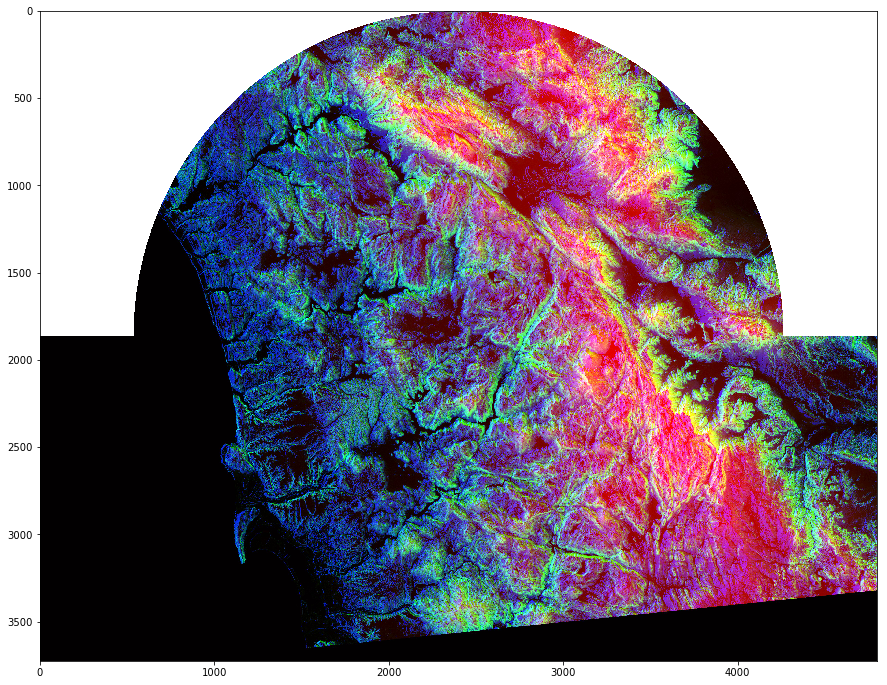

In [23]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')
photo_data[half_upper_sieve] = random.randint(200,255)
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

In [24]:
# Let us try to do something fancy with this Satellite Image

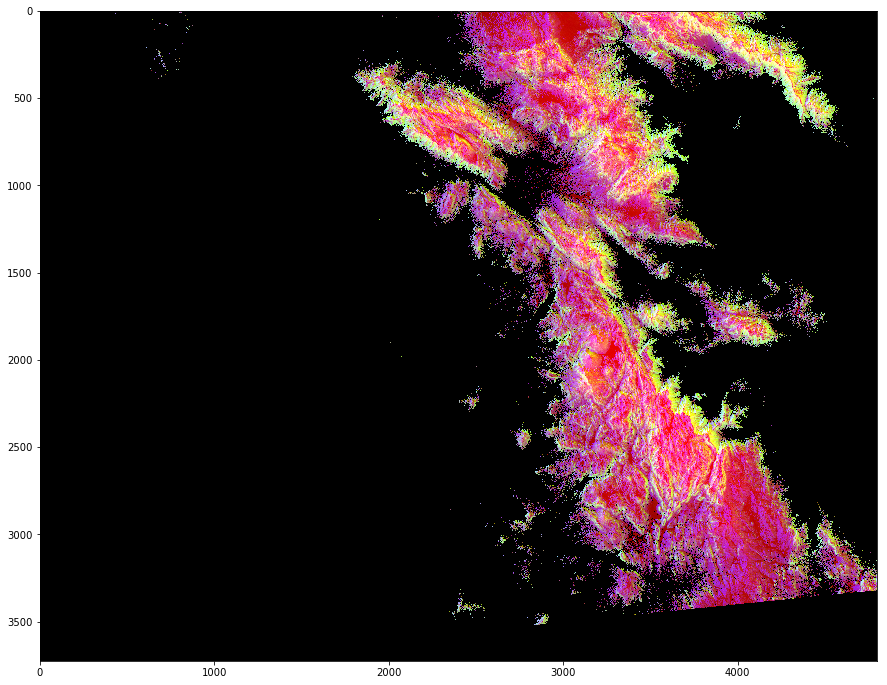

In [25]:
# If RED Pixels tell us about the height, let us try to highlight all the high altitude areas

# Detect highly RED Pixels by lighting down other areas:


photo_data = misc.imread('./wifire/sd-3layers.jpg')
red_mask   = photo_data[:, : ,0] <150

photo_data[red_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

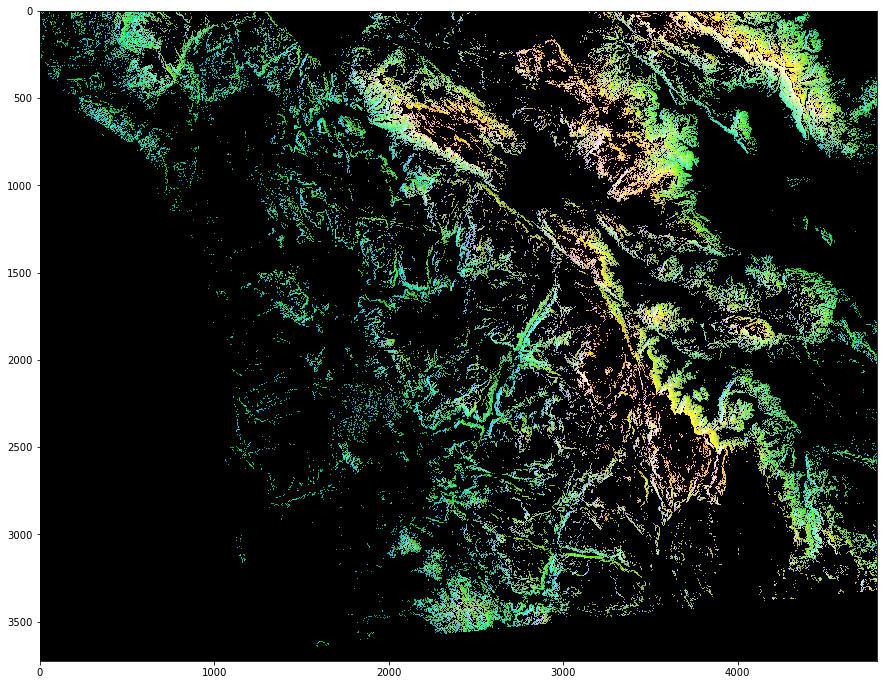

In [26]:
# Detect highly GREEN Pixels by lighting down other areas:

photo_data = misc.imread('./wifire/sd-3layers.jpg')
green_mask = photo_data[:, : ,1] <150

photo_data[green_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

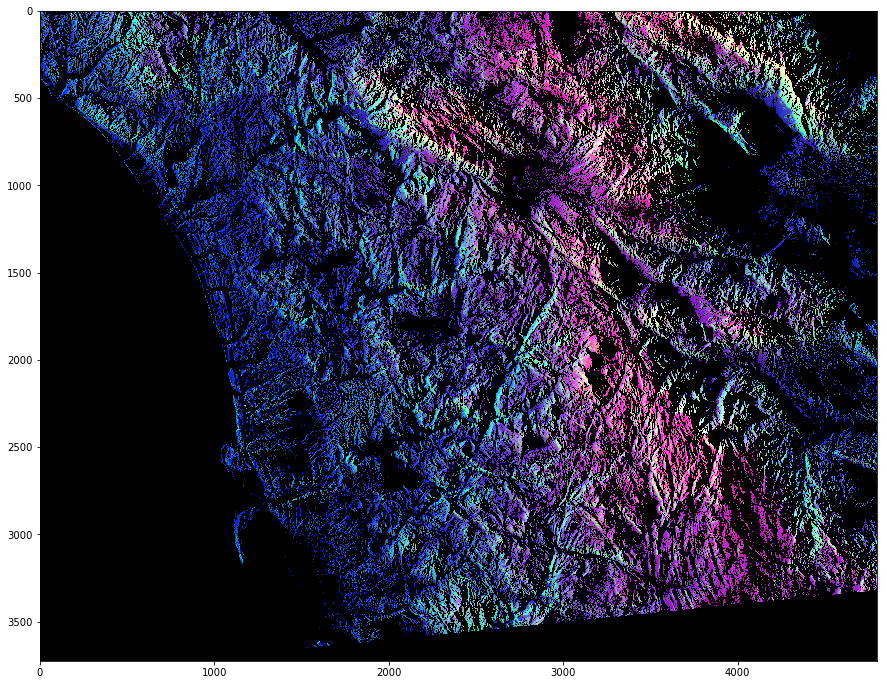

In [27]:
# Detect highly BLUE Pixels by lighting down other areas:

photo_data = misc.imread('./wifire/sd-3layers.jpg')
blue_mask  = photo_data[:, : ,2] <150

photo_data[blue_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

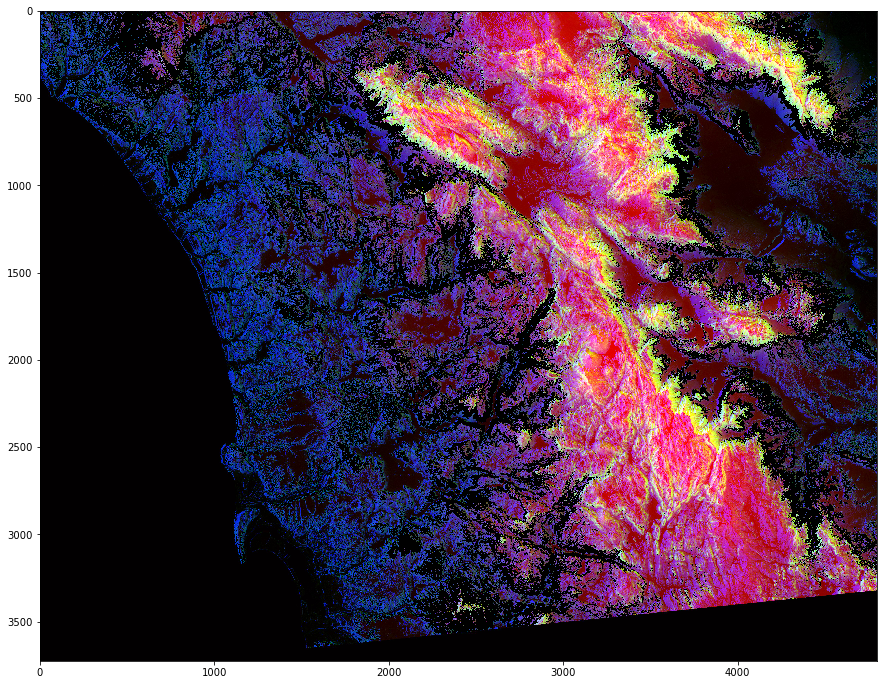

In [28]:
# Composite mask that takes thresholds on all three layers: RED, GREEN, BLUE

photo_data = misc.imread('./wifire/sd-3layers.jpg')

red_mask   = photo_data[:, : ,0] <150
green_mask = photo_data[:, : ,1] >100
blue_mask  = photo_data[:, : ,2] <100

final_mask = np.logical_and(red_mask, green_mask, blue_mask)
photo_data[final_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)